# DATASET BREAST CANCER

Librerías para el desarrollo de los dataset.

In [1]:
import sklearn 
from sklearn import linear_model
import pandas as pd
import numpy as np
import seaborn as sns  # data visualization library  
import matplotlib.pyplot as plt
import time
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
import nltk
import sklearn

# DATASET 1 breast-cancer.csv (wdbc.data)

In [2]:
data=pd.read_csv('C:\MAESTRIA\PROYECTO_FINAL\\breast-cancer.csv')
data

,842302,M,17.99,10.38,122.8,1001,0.1184,0.2776,0.3001,0.1471,...,25.38,17.33,184.6,2019,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189
0,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
1,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
2,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
3,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
4,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.470,23.75,103.40,741.6,0.17910,0.52490,0.5355,0.1741,0.3985,0.12440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
563,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
564,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
565,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
566,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


Consultar el numero de columnas.

In [3]:
columns = data.columns
columns

Index(['842302', 'M', '17.99', '10.38', '122.8', '1001', '0.1184', '0.2776',
       '0.3001', '0.1471', '0.2419', '0.07871', '1.095', '0.9053', '8.589',
       '153.4', '0.006399', '0.04904', '0.05373', '0.01587', '0.03003',
       '0.006193', '25.38', '17.33', '184.6', '2019', '0.1622', '0.6656',
       '0.7119', '0.2654', '0.4601', '0.1189'],
      dtype='object')

Renombramos las columnas con los nombres de .name.

In [4]:
data = data.rename(columns = {'842302':'id', 'M': 'diagnosis', '17.99':'radius_mean', '10.38':'texture_mean', 
        '122.8':'perimeter_mean', '1001':'area_mean', '0.1184':'smoothness_mean', '0.2776':'compactness_mean',
       '0.3001':'concavity_mean', 
        '0.1471':'concave points_mean', '0.2419':'symmetry_mean',
        '0.07871':'fractal_dimension_mean', '1.095':'radius_se', '0.9053':'texture_se', '8.589':'perimeter_se',
       '153.4':'area_se', '0.006399':'smoothness_se', '0.04904':'compactness_se', '0.05373':'concavity_se',
        '0.01587':'concave points_se', '0.03003':'symmetry_se',
       '0.006193':'fractal_dimension_se', '25.38':'radius_worst', '17.33':'texture_worst', '184.6':'perimeter_worst',
        '2019':'area_worst', '0.1622':'smoothness_worst', '0.6656':'compactness_worst',
       '0.7119':'concavity_worst', '0.2654':'concave points_worst', '0.4601':'symmetry_worst', '0.1189':'fractal_dimension_worst'})
data

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
1,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
2,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
3,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
4,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.470,23.75,103.40,741.6,0.17910,0.52490,0.5355,0.1741,0.3985,0.12440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
563,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
564,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
565,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
566,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [5]:
#Número de filas y columnas
data.shape

(568, 32)

In [6]:
#Validar columnas vacias
data.isna().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

Conteo de pacientes de cáncer Maligno y Benigno.

In [7]:
data['diagnosis'].value_counts()

B    357
M    211
Name: diagnosis, dtype: int64

No of benign 357
No of malignant 211


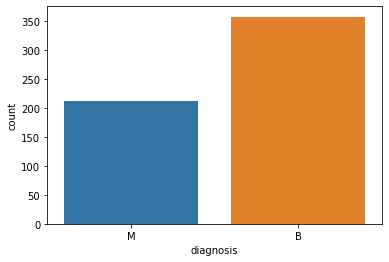

In [8]:
#Generamos la grafica.
y = data.diagnosis
col_list_drops=['id','diagnosis']
x= data.drop(col_list_drops,axis=1)
x.head()

ax = sns.countplot(y, label='Count')
B, M= y.value_counts()  #B = belignant
print("No of benign",B) 
print("No of malignant",M)

Codificar los datos categoricos, cambiar M y B a 1 y 0

In [9]:
from sklearn.preprocessing import LabelEncoder
LabelEncoder = LabelEncoder()
data.iloc[:,1] = LabelEncoder.fit_transform(data.iloc[:,1].values)

print(LabelEncoder.fit_transform(data.iloc[:,1].values))

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0
 1 1 1 1 1 1 1 1 0 1 0 0 0 0 0 1 1 0 1 1 0 0 0 0 1 0 1 1 0 0 0 0 1 0 1 1 0
 1 0 1 1 0 0 0 1 1 0 1 1 1 0 0 0 1 0 0 1 1 0 0 0 1 1 0 0 0 0 1 0 0 1 0 0 0
 0 0 0 0 0 1 1 1 0 1 1 0 0 0 1 1 0 1 0 1 1 0 1 1 0 0 1 0 0 1 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 0 0 0 1 0 0 1 1 1 0 1 0
 1 0 0 0 1 0 0 1 1 0 1 1 1 1 0 1 1 1 0 1 0 1 0 0 1 0 1 1 1 1 0 0 1 1 0 0 0
 1 0 0 0 0 0 1 1 0 0 1 0 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 0 0 0 0 0 1 0 1 0 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 1 1 1 0 0 0
 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 1 1
 0 1 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 1 0 0 1
 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 1 0 1 0 0 1 0 

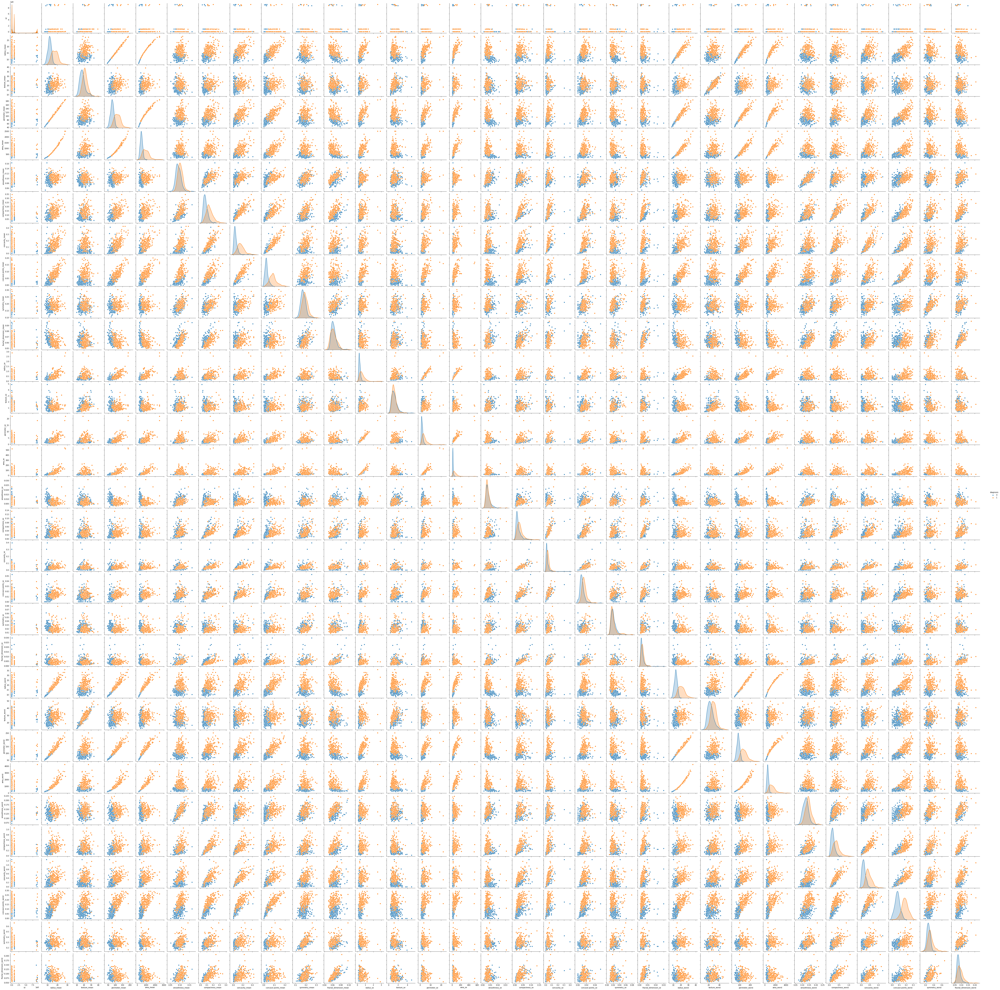

In [10]:
sns.pairplot(data,hue="diagnosis")

Obtenemos la correlación de las columnas.

In [11]:
data.corr()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,1.000000,0.040370,0.075166,0.099288,0.073796,0.097390,-0.012343,0.001476,0.051507,0.045472,...,0.083457,0.064262,0.081329,0.108408,0.010899,-0.001891,0.024177,0.036300,-0.043371,-0.029157
diagnosis,0.040370,1.000000,0.729376,0.422146,0.741887,0.708389,0.356276,0.595587,0.695648,0.776369,...,0.775725,0.461443,0.782470,0.732925,0.419731,0.589453,0.658348,0.793181,0.413382,0.320983
radius_mean,0.075166,0.729376,1.000000,0.329383,0.997876,0.987344,0.168094,0.505129,0.676557,0.823165,...,0.969964,0.300440,0.966231,0.941537,0.117392,0.411329,0.525454,0.744025,0.159877,0.003339
texture_mean,0.099288,0.422146,0.329383,1.000000,0.335918,0.326193,-0.017769,0.252038,0.315248,0.305590,...,0.361964,0.912020,0.369573,0.353434,0.082714,0.290229,0.311122,0.306278,0.116263,0.127177
perimeter_mean,0.073796,0.741887,0.997876,0.335918,1.000000,0.986548,0.204505,0.555676,0.715662,0.851338,...,0.969675,0.307013,0.971157,0.941735,0.148059,0.453304,0.562165,0.770783,0.184458,0.046909
area_mean,0.097390,0.708389,0.987344,0.326193,0.986548,1.000000,0.174838,0.497981,0.686232,0.824246,...,0.963319,0.290565,0.960440,0.959952,0.121543,0.388554,0.511392,0.722009,0.139856,0.000382
smoothness_mean,-0.012343,0.356276,0.168094,-0.017769,0.204505,0.174838,1.000000,0.657741,0.519002,0.551009,...,0.209018,0.039977,0.234093,0.202344,0.804667,0.469090,0.431727,0.500119,0.390161,0.496684
compactness_mean,0.001476,0.595587,0.505129,0.252038,0.555676,0.497981,0.657741,1.000000,0.881619,0.829050,...,0.531125,0.258877,0.585188,0.504612,0.564204,0.864097,0.815021,0.813810,0.502439,0.684961
concavity_mean,0.051507,0.695648,0.676557,0.315248,0.715662,0.686232,0.519002,0.881619,1.000000,0.920462,...,0.685826,0.308645,0.726703,0.673187,0.446155,0.751937,0.883184,0.859918,0.401782,0.510736
concave points_mean,0.045472,0.776369,0.823165,0.305590,0.851338,0.824246,0.551009,0.829050,0.920462,1.000000,...,0.829188,0.301004,0.854468,0.808120,0.450145,0.663532,0.750169,0.909272,0.368009,0.363277


Mapa de calor para visualizar correlación.

<AxesSubplot:>

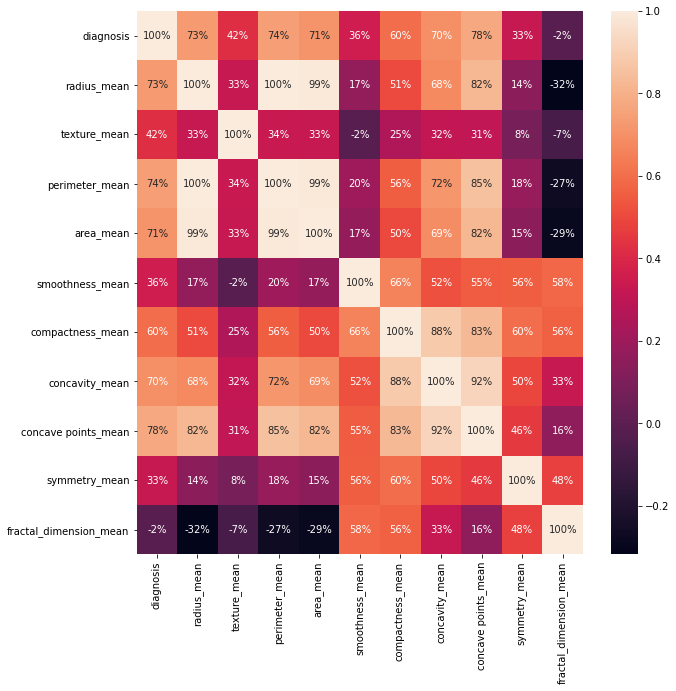

In [12]:
plt.figure(figsize=(10,10))
sns.heatmap(data.iloc[:,1:12].corr(),annot=True,fmt='.0%')
#plt.gcf().set_size_inches(40,20)
#plt.figure(figsize=(20,20))  
#sns.heatmap(data.corr(), annot=True, fmt='.0%')

# Preparación de Datos

Creación de Varaibles independiente y dependiente.
X=Independiente y Y=Dependientes

In [13]:
X = data.iloc[:, 2:31].values 
Y = data.iloc[:, 1].values 

In [14]:
#Dataset 75% entrenamiento y 25% pruebas
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [15]:
#Levar las características al mismo nivel de magnitud, ejemplo: 0 -100 o 0 - 1
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

Creación de modelos diferentes.

In [16]:
def models(X_train,Y_train):
  
  #Using Logistic Regression 
  from sklearn.linear_model import LogisticRegression
  log = LogisticRegression(random_state = 0)
  log.fit(X_train, Y_train)
  
  #Using KNeighborsClassifier 
  from sklearn.neighbors import KNeighborsClassifier
  knn = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
  knn.fit(X_train, Y_train)

  #Using SVC linear
  from sklearn.svm import SVC
  svc_lin = SVC(kernel = 'linear', random_state = 0)
  svc_lin.fit(X_train, Y_train)

  #Using SVC rbf
  from sklearn.svm import SVC
  svc_rbf = SVC(kernel = 'rbf', random_state = 0)
  svc_rbf.fit(X_train, Y_train)

  #Using GaussianNB 
  from sklearn.naive_bayes import GaussianNB
  gauss = GaussianNB()
  gauss.fit(X_train, Y_train)

  #Using DecisionTreeClassifier 
  from sklearn.tree import DecisionTreeClassifier
  tree = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
  tree.fit(X_train, Y_train)

  #Using RandomForestClassifier method of ensemble class to use Random Forest Classification algorithm
  from sklearn.ensemble import RandomForestClassifier
  forest = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
  forest.fit(X_train, Y_train)
  
  #print model accuracy on the training data.
  print('[0]Logistic Regression Training Accuracy:', log.score(X_train, Y_train))
  print('[1]K Nearest Neighbor Training Accuracy:', knn.score(X_train, Y_train))
  print('[2]Support Vector Machine (Linear Classifier) Training Accuracy:', svc_lin.score(X_train, Y_train))
  print('[3]Support Vector Machine (RBF Classifier) Training Accuracy:', svc_rbf.score(X_train, Y_train))
  print('[4]Gaussian Naive Bayes Training Accuracy:', gauss.score(X_train, Y_train))
  print('[5]Decision Tree Classifier Training Accuracy:', tree.score(X_train, Y_train))
  print('[6]Random Forest Classifier Training Accuracy:', forest.score(X_train, Y_train))
  
  return log, knn, svc_lin, svc_rbf, gauss, tree, forest

Creamos el modelo y observamos la puntuación de precisión.

In [17]:
model = models(X_train,Y_train)

[0]Logistic Regression Training Accuracy: 0.9882629107981221
[1]K Nearest Neighbor Training Accuracy: 0.9741784037558685
[2]Support Vector Machine (Linear Classifier) Training Accuracy: 0.9882629107981221
[3]Support Vector Machine (RBF Classifier) Training Accuracy: 0.9859154929577465
[4]Gaussian Naive Bayes Training Accuracy: 0.9460093896713615
[5]Decision Tree Classifier Training Accuracy: 1.0
[6]Random Forest Classifier Training Accuracy: 0.9976525821596244


Generamos la matriz de confusión

In [18]:
from sklearn.metrics import confusion_matrix
for i in range(len(model)):
  cm = confusion_matrix(Y_test, model[i].predict(X_test))
  
  TN = cm[0][0]
  TP = cm[1][1]
  FN = cm[1][0]
  FP = cm[0][1]
  
  print(cm)
  print('Model[{}] Testing Accuracy = "{}!"'.format(i,  (TP + TN) / (TP + TN + FN + FP)))
  print()# Print a new line

[[91  1]
 [ 3 47]]
Model[0] Testing Accuracy = "0.971830985915493!"

[[91  1]
 [ 6 44]]
Model[1] Testing Accuracy = "0.9507042253521126!"

[[90  2]
 [ 4 46]]
Model[2] Testing Accuracy = "0.9577464788732394!"

[[92  0]
 [ 6 44]]
Model[3] Testing Accuracy = "0.9577464788732394!"

[[89  3]
 [ 6 44]]
Model[4] Testing Accuracy = "0.9366197183098591!"

[[84  8]
 [ 6 44]]
Model[5] Testing Accuracy = "0.9014084507042254!"

[[89  3]
 [ 6 44]]
Model[6] Testing Accuracy = "0.9366197183098591!"



Mostrar otras formas de obtener la precisión de la clasificación y otras métricas

In [19]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

for i in range(len(model)):
  print('Model ',i)
  #Compruobamos la precisión, el recuerdo, la puntuación f1
  print( classification_report(Y_test, model[i].predict(X_test)) )
  #Otra forma de obtener la precisión de los modelos en los datos de prueba
  print( accuracy_score(Y_test, model[i].predict(X_test)))
  print()#Imprime una nueva línea

Model  0
              precision    recall  f1-score   support

           0       0.97      0.99      0.98        92
           1       0.98      0.94      0.96        50

    accuracy                           0.97       142
   macro avg       0.97      0.96      0.97       142
weighted avg       0.97      0.97      0.97       142

0.971830985915493

Model  1
              precision    recall  f1-score   support

           0       0.94      0.99      0.96        92
           1       0.98      0.88      0.93        50

    accuracy                           0.95       142
   macro avg       0.96      0.93      0.94       142
weighted avg       0.95      0.95      0.95       142

0.9507042253521126

Model  2
              precision    recall  f1-score   support

           0       0.96      0.98      0.97        92
           1       0.96      0.92      0.94        50

    accuracy                           0.96       142
   macro avg       0.96      0.95      0.95       142
weighted

Impresión predicción del modelo de clasificador de bosque aleatorio.

In [20]:
pred = model[6].predict(X_test)
print(pred)

#Imprimir espacio
print()

#Imprimir valores reales.
print(Y_test)

[0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 1 0 1 1 0 1 1 1 0
 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0
 0 0 0 0 1 1 1 0 1 0 0 1 0 1 1 1 1 0 0 1 1 0 0 0 1 0 1 1 0 0 0 0 0 0 1 1 0
 1 1 1 1 0 0 0 1 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1]

[0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0 1 1 0 1 1 0 0 1 1 0
 0 1 0 0 0 1 0 0 1 0 1 0 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0
 0 0 0 0 1 1 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 0 0 0 0 0 1 1 0 0 1 0 0 0 1 1 0
 1 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 1]


A partir de los datos recopilados el mejor modelo al que podríamos optar es Logistic Regression, ya que las métricas y precisión obtenidas anteriormente nos hace creer esto, con una precisión de casi 97%.

In [21]:
from sklearn.model_selection import train_test_split, ParameterGrid, cross_val_score, RepeatedKFold, RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score


In [22]:
#Imagen de modelos y predicciones.
def model_Evaluate(model):
    
    # Predict values for Test dataset
    y_pred = model.predict(X_test)

    # Print the evaluation metrics for the dataset.
    print(classification_report(Y_test, y_pred))
    
    # Compute and plot the Confusion matrix
    cf_matrix = confusion_matrix(Y_test, y_pred)

    categories  = ['Negative','Positive']
    group_names = ['True Neg','False Pos', 'False Neg','True Pos']
    group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

    labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cf_matrix, annot = labels, cmap = 'Blues',fmt = '',
                xticklabels = categories, yticklabels = categories)

    plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
    plt.ylabel("Actual values"   , fontdict = {'size':14}, labelpad = 10)
    plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98        92
           1       0.98      0.94      0.96        50

    accuracy                           0.97       142
   macro avg       0.97      0.96      0.97       142
weighted avg       0.97      0.97      0.97       142



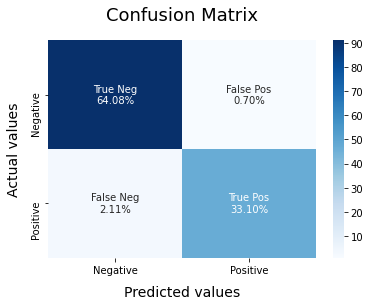

In [23]:
#Logistic Regression Model
lr = LogisticRegression()
lr.fit(X_train, Y_train)
acc_lr= model_Evaluate(lr)

              precision    recall  f1-score   support

           0       0.96      0.98      0.97        92
           1       0.96      0.92      0.94        50

    accuracy                           0.96       142
   macro avg       0.96      0.95      0.95       142
weighted avg       0.96      0.96      0.96       142



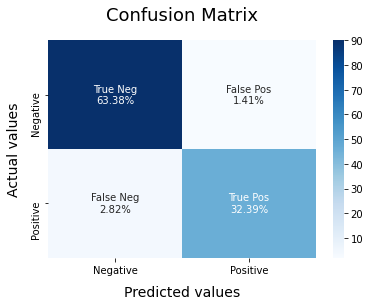

In [24]:
#Random Forest Model
rf = RandomForestClassifier()
rf.fit(X_train, Y_train)
acc_rf= model_Evaluate(rf)


              precision    recall  f1-score   support

           0       0.93      0.92      0.93        92
           1       0.86      0.88      0.87        50

    accuracy                           0.91       142
   macro avg       0.90      0.90      0.90       142
weighted avg       0.91      0.91      0.91       142



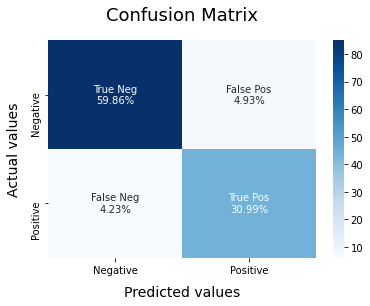

In [25]:
#Decision Tree Model
dc = DecisionTreeClassifier()
dc.fit(X_train, Y_train)
acc_dc= model_Evaluate(dc)

# DATASET 2 breast-cancer-wisconsin.data

Cargamos las librerias que vamos a utilizar

In [26]:
from funpymodeling.exploratory import freq_tbl, status, profiling_num, cat_vars, num_vars, corr_pair


In [27]:
data=pd.read_csv('C:\MAESTRIA\PROYECTO_FINAL\\breast-cancer-wisconsin.data')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 698 entries, 0 to 697
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   1000025  698 non-null    int64 
 1   5        698 non-null    int64 
 2   1        698 non-null    int64 
 3   1.1      698 non-null    int64 
 4   1.2      698 non-null    int64 
 5   2        698 non-null    int64 
 6   1.3      698 non-null    object
 7   3        698 non-null    int64 
 8   1.4      698 non-null    int64 
 9   1.5      698 non-null    int64 
 10  2.1      698 non-null    int64 
dtypes: int64(10), object(1)
memory usage: 60.1+ KB


Renombramos columnas según lo que indica el archivo de names

In [28]:
data = data.rename(columns={"1000025": "Sample code number", 
                             "5": "Clump Thickness", 
                             '1' : 'Uniformity of Cell Size',
                             '1.1':'Uniformity of Cell Shape',
                             '1.2':'Marginal Adhesion',
                             '2': 'Single Epithelial Cell Size',
                             '1.3': 'Bare Nuclei',
                             '3': 'Bland Chromatin',
                             '1.4': 'Normal Nucleoli',
                             '1.5': 'Mitoses',
                             '2.1': 'Class'})

Exploración dataset

In [29]:
data.head()

,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
0,1002945,5,4,4,5,7,10,3,2,1,2
1,1015425,3,1,1,1,2,2,3,1,1,2
2,1016277,6,8,8,1,3,4,3,7,1,2
3,1017023,4,1,1,3,2,1,3,1,1,2
4,1017122,8,10,10,8,7,10,9,7,1,4


**Clase a predecir**<br>
<br>
Cuando dice 2 significa que el tumor es benigno (no tiene cáncer). En cambio cuando dice 4, significa maligno ( si tiene cáncer).<br>
Le asignamos 0 y 1 a la clase. 0 = benigno 1 = maligno<br>
Esto lo hacemos para posteriormente entrenar correctamente el modelo 

In [30]:
data_map = {2: 0, 4: 1}
data['Class'] = data['Class'].map(data_map)

¿Cuantos casos son de tumores benignos y cuantos malignos? (tabla y countplot)<br>
65% de los pacientes presentan tumores benignos
El 35% restante presenta tumor maligno

,Class,frequency,percentage,cumulative_perc
0,0,457,0.654728,0.654728
1,1,241,0.345272,1.000000


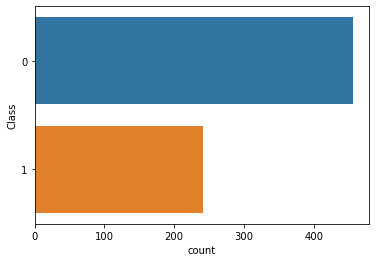

In [31]:
sns.countplot(y='Class', data=data)   
freq_tbl(data['Class'].astype('str'))

**¿Las variables tienen mucha variación? ¿cuales son sus percentiles?**

In [32]:
profiling_num(data)

,variable,mean,std_dev,variation_coef,p_0.01,p_0.05,p_0.25,p_0.5,p_0.75,p_0.95,p_0.99
0,Sample code number,1.071807e+06,617532.274029,0.576160,145430.23,411453.0,870258.25,1171710.0,1238354.0,1333897.7,1368267.18
1,Clump Thickness,4.416905e+00,2.817673,0.637929,1.00,1.0,2.00,4.0,6.0,10.0,10.00
2,Uniformity of Cell Size,3.137536e+00,3.052575,0.972921,1.00,1.0,1.00,1.0,5.0,10.0,10.00
3,Uniformity of Cell Shape,3.210602e+00,2.972867,0.925953,1.00,1.0,1.00,1.0,5.0,10.0,10.00
4,Marginal Adhesion,2.809456e+00,2.856606,1.016783,1.00,1.0,1.00,1.0,4.0,10.0,10.00
5,Single Epithelial Cell Size,3.217765e+00,2.215408,0.688493,1.00,1.0,2.00,2.0,4.0,8.0,10.00
6,Bland Chromatin,3.438395e+00,2.440056,0.709650,1.00,1.0,2.00,3.0,5.0,8.0,10.00
7,Normal Nucleoli,2.869628e+00,3.055004,1.064600,1.00,1.0,1.00,1.0,4.0,10.0,10.00
8,Mitoses,1.590258e+00,1.716162,1.079172,1.00,1.0,1.00,1.0,1.0,5.0,10.00
9,Class,3.452722e-01,0.475798,1.378037,0.00,0.0,0.00,0.0,1.0,1.0,1.00


# Preparación de los datos

**Registros duplicados**

Son 54 en total<br>
Pero los voy a dejar, podría ser que la misma persona se haya hecho estudios otra vez, pero tendría distintos valores

In [33]:
data [data.duplicated(subset="Sample code number") ]

,Sample code number,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
8,1033078,4,2,1,1,2,1,2,1,1,0
29,1070935,3,1,1,1,1,1,2,1,1,0
81,1143978,5,2,1,1,2,1,3,1,1,0
108,1171710,6,5,4,4,3,9,7,8,3,1
115,1173347,8,3,3,1,2,2,3,2,1,0
120,1174057,4,2,1,1,2,2,3,1,1,0
194,1212422,4,1,1,1,2,1,3,1,1,0
207,1218860,1,1,1,1,1,1,3,1,1,0
251,1017023,6,3,3,5,3,10,3,5,3,0
252,1100524,6,10,10,2,8,10,7,3,3,1


Entonces, veamos si alguno de esos duplicados, tambien esta duplicado en las demas variables

In [34]:
freq_tbl(data.duplicated().astype('str'))

,None,frequency,percentage,cumulative_perc
0,False,690,0.988539,0.988539
1,True,8,0.011461,1.000000


Efectivamente, hay 8 registros que esten completamente duplicados. Esos los vamos a eliminar

In [35]:
data.drop_duplicates(keep=False,inplace=True)

Eliminemos la variable ID Sample code number, ya que no la vamos a utilizar en el modelo

In [36]:
data = data.drop(['Sample code number'],axis=1)

**Veamos que sucede con la variable Bare Nuclei**

In [37]:
freq_tbl(data['Bare Nuclei'])

,Bare Nuclei,frequency,percentage,cumulative_perc
0,1,391,0.573314,0.573314
1,10,128,0.187683,0.760997
2,2,30,0.043988,0.804985
3,5,30,0.043988,0.848974
4,3,28,0.041056,0.890029
5,4,19,0.027859,0.917889
6,8,19,0.027859,0.945748
7,?,16,0.023460,0.969208
8,9,9,0.013196,0.982405
9,7,8,0.011730,0.994135


Hay 16 registros en donde la variable llega como '?'<br>
Según la documentación oficial (en ingles):<br>
<br>
8. Missing attribute values: 16<br>
   There are 16 instances in Groups 1 to 6 that contain a single missing <br>
   (i.e., unavailable) attribute value, now denoted by "?".  <br>
   <br>
Un posible enfoque sería reemplazar esos '?' por la media (promedio) de todo el set de datos para esa variable.<br>

In [38]:
# Primero los pasamos a nulo
data['Bare Nuclei'] = data['Bare Nuclei'].replace({'?': np.nan})

In [39]:
# Ahora convertimos el tipo de datos. A integer no permite por tener nulo, pero si me deja a float
data['Bare Nuclei']=data['Bare Nuclei'].astype(float) 

In [40]:
# Reemplazo los nulos por la media 
data['Bare Nuclei']=data['Bare Nuclei'].fillna(data['Bare Nuclei'].mean())

In [41]:
# Finalmente convierto a int
data['Bare Nuclei']=data['Bare Nuclei'].astype(int)

# Correlaciones
¿Cuales son las variables que más influyen a detectar si tiene cancer o no?<br>
Vamos a usar la función corr_pair de funpymodeling

In [42]:
cor_d=corr_pair(data)
cor_d_class = cor_d[cor_d['v1']=='Class']
cor_d_class.sort_values(by=['R2'],ascending=False)

,v1,v2,R,R2
19,Class,Uniformity of Cell Size,0.817403,0.668147
29,Class,Uniformity of Cell Shape,0.816281,0.666315
59,Class,Bare Nuclei,0.812807,0.660656
69,Class,Bland Chromatin,0.756743,0.572660
79,Class,Normal Nucleoli,0.718751,0.516603
9,Class,Clump Thickness,0.718421,0.516129
39,Class,Marginal Adhesion,0.705869,0.498250
49,Class,Single Epithelial Cell Size,0.679478,0.461690
89,Class,Mitoses,0.424917,0.180554


Vemos rápidamente las correlaciones.<br>
R2 indica si hay correlación. 0= no hay correlacion 1= mucha correlacion<br>
R tambien indica si hay correlación, y si es positiva o negativa. -1=negativa 0=no hay correlacion 1=positiva

Estas parecen ser las 5 variables que más ayudan a predecir la clase: (en este orden)
1. Uniformity of Cell Shape
1. Uniformity of Cell Size
1. Bare Nuclei
1. Bland Chromatin
1. Clump Thickness

¿Hay variables que tienen mucha correlación entre si? Esto indicaria que podemos prescindir de alguna<br>
Por ejemplo, sabiendo la fecha de nacimiento, podríamos saber la edad de una persona. Entonces la variable edad es prescindible<br>
Veamoslo con el estadístico Pearson

In [43]:
data.corr().sort_values(by=['Class'],ascending=False)

,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
Class,0.718421,0.817403,0.816281,0.705869,0.679478,0.812807,0.756743,0.718751,0.424917,1.000000
Uniformity of Cell Size,0.642202,1.000000,0.903828,0.720726,0.742089,0.683354,0.763562,0.731621,0.461356,0.817403
Uniformity of Cell Shape,0.653429,0.903828,1.000000,0.698987,0.708722,0.703343,0.741183,0.729986,0.442202,0.816281
Bare Nuclei,0.590444,0.683354,0.703343,0.677446,0.575909,1.000000,0.673202,0.584450,0.340834,0.812807
Bland Chromatin,0.563873,0.763562,0.741183,0.673042,0.625137,0.673202,1.000000,0.672353,0.343426,0.756743
Normal Nucleoli,0.535929,0.731621,0.729986,0.601291,0.639324,0.584450,0.672353,1.000000,0.426781,0.718751
Clump Thickness,1.000000,0.642202,0.653429,0.489907,0.513256,0.590444,0.563873,0.535929,0.350818,0.718421
Marginal Adhesion,0.489907,0.720726,0.698987,1.000000,0.617544,0.677446,0.673042,0.601291,0.416526,0.705869
Single Epithelial Cell Size,0.513256,0.742089,0.708722,0.617544,1.000000,0.575909,0.625137,0.639324,0.486234,0.679478
Mitoses,0.350818,0.461356,0.442202,0.416526,0.486234,0.340834,0.343426,0.426781,1.000000,0.424917


Parece que hay correlacion entre Uniformity of Cell Shape y Uniformity of Cell Size (0.906814). <br>
Es decir, sabiendo una, es posible predecir la otra.<br>
Si consideramos 0.90 como mínimo para decir que esta altamente correlacionada, esas dos serían las unicas (algunas dan 1 porque se comparan con si mismas).
Nota: si bien vemos que estan muy correlacionadas, en este caso dejamos ambas variables ya que tenemos pocas en nuestro set de datos.

Graficamente: Cuanto más azul el cuadro, menos relacion hay.
En contraste, en los focos rojos es donde se encuentran las correlaciones.

<AxesSubplot:>

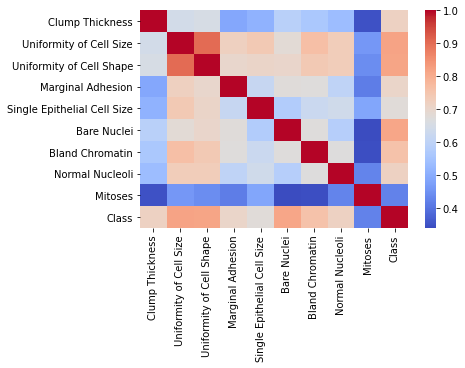

In [44]:
sns.heatmap(data.corr(), cmap='coolwarm')

# ¿Como influye cada variable importante sobre la variable a predecir?

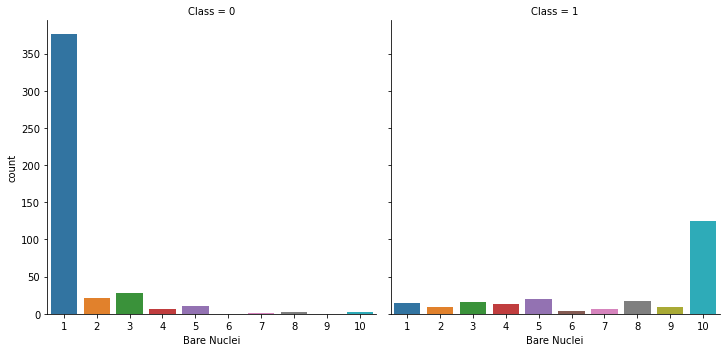

In [45]:
g = sns.catplot(x="Bare Nuclei",
                col="Class",
                data= data,
                kind="count")

En casos que no hay cáncer, la mayoria tiene un Bare Nuclei de 1.<br>
Sin embargo, en los que si hay cáncer, vemos que muchos tienen un Bare Nuclei de 10<br>
Es decir, si el Bare nuclei es de 10, es probable que la persona tenga cancer.<br>

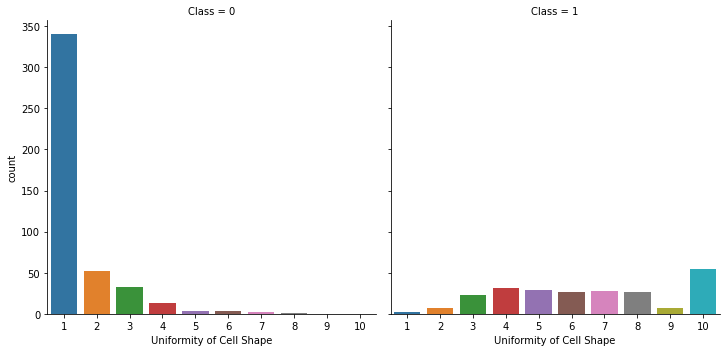

In [46]:
g = sns.catplot(x="Uniformity of Cell Shape",
                col="Class",
                data= data,
                kind="count")

En los tumores benignos, la mayoria tiene un Uniformity of Cell Shape de 1.<br>
Sin embargo los malignos, vemos que tienen un Uniformity of Cell Shape de 10<br>
Es decir, si el Uniformity of Cell Shape es de 10, es probable que la persona tenga cancer.<br>

array([[<AxesSubplot:title={'center':'Clump Thickness'}>,
        <AxesSubplot:title={'center':'Uniformity of Cell Size'}>,
        <AxesSubplot:title={'center':'Uniformity of Cell Shape'}>],
       [<AxesSubplot:title={'center':'Marginal Adhesion'}>,
        <AxesSubplot:title={'center':'Single Epithelial Cell Size'}>,
        <AxesSubplot:title={'center':'Bare Nuclei'}>],
       [<AxesSubplot:title={'center':'Bland Chromatin'}>,
        <AxesSubplot:title={'center':'Normal Nucleoli'}>,
        <AxesSubplot:title={'center':'Mitoses'}>],
       [<AxesSubplot:title={'center':'Class'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

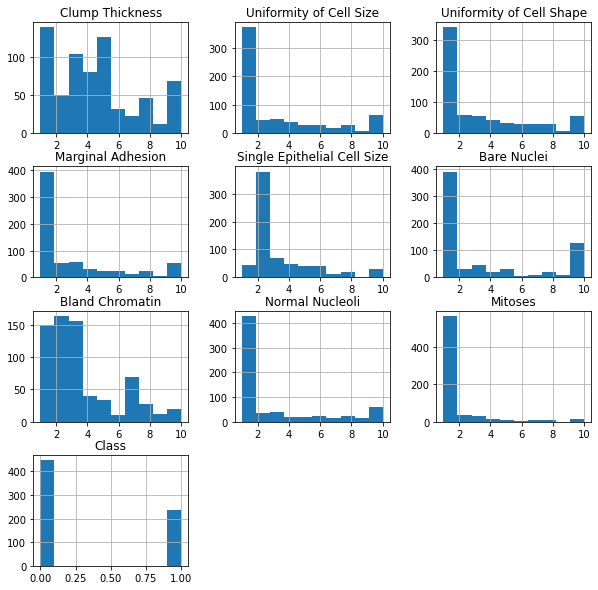

In [47]:
data.hist(figsize = (10,10))

# Modelo de predicción

Vamos a usar un modelo de regresión logística. <br>
Este modelo nos va a predecir, por cada registro, la probabilidad de que la persona tenga cáncer<br>
1. Primero que todo separamos nuestras variables de entrada, de nuestras variables de salida
1. Luego escalamos los datos de entrada (este es requisito del modelo)
1. Una vez tenemos nuestros datos de entrada ya escalados, separamos nuestros datos. <br>
Por un lado vamos a tener los datos de training (80% de los datos) y por el otro, datos de testing (20%). <br>
1. Entrenamos nuestro modelo con los datos de training, y luego eso se prueba con los datos de test

In [48]:
# 1. Separamos nuestras variables de entrada, de nuestras variables de salida
data_x=data.drop('Class', axis=1)
data_y=data['Class']
# 2. Escalamos los datos de entrada
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x_scaled = scaler.fit_transform(data_x)
# 3. separamos nuestros datos
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x_scaled, data_y, test_size=0.2)

Entrenamos nuestro modelo con los datos de training<br>
Basicamente le decimos al modelo que con las variables de entrada 'x', la salida es 'y'

In [49]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(x_train,y_train)

LogisticRegression()

¿Qué devuelve el modelo? Devuelve la probabilidad de que sí tenga cáncer. <br>
Sería la segunda columna del siguiente array:

In [50]:
model.predict_proba(x_test)

array([[9.95056982e-01, 4.94301842e-03],
       [9.94783127e-01, 5.21687257e-03],
       [9.98392725e-01, 1.60727498e-03],
       [9.93318674e-01, 6.68132628e-03],
       [9.96614094e-01, 3.38590623e-03],
       [2.44300897e-05, 9.99975570e-01],
       [9.87663559e-01, 1.23364407e-02],
       [1.34591458e-02, 9.86540854e-01],
       [9.98150373e-01, 1.84962748e-03],
       [1.21953619e-03, 9.98780464e-01],
       [8.95885678e-01, 1.04114322e-01],
       [4.14957236e-04, 9.99585043e-01],
       [9.96926492e-01, 3.07350751e-03],
       [9.97496003e-01, 2.50399716e-03],
       [9.98588466e-01, 1.41153431e-03],
       [9.74286525e-01, 2.57134749e-02],
       [9.65308119e-01, 3.46918808e-02],
       [1.11854453e-04, 9.99888146e-01],
       [1.28348703e-02, 9.87165130e-01],
       [1.60414263e-02, 9.83958574e-01],
       [9.95362264e-01, 4.63773611e-03],
       [9.98813932e-01, 1.18606765e-03],
       [9.68318081e-01, 3.16819191e-02],
       [1.42906263e-02, 9.85709374e-01],
       [1.336223

Veamos la matriz de confusión para training, con un **punto de corte de 0.5**<br>
Un punto de corte de 0.5 quiere decir que si la probabilidad de que tenga cáncer es mayor a 50% el modelo le asigna que SI tiene cáncer. <br>
En cambio, si es menor a 50% el modelo declara que NO tiene cáncer

<AxesSubplot:xlabel='Prediction', ylabel='Actual'>

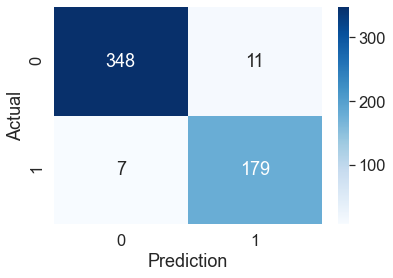

In [51]:
y_pred50=model.predict(x_train)

sns.set(font_scale=1.5) #  Ajuste tamaño de letra (var global)
conf_mat1=pd.crosstab(index=y_train, # filas = valor real
                     columns=y_pred50, # columnas = valor predicho
                     rownames=['Actual'], 
                     colnames=['Prediction']
                     )

import seaborn as sns
sns.heatmap(conf_mat1, annot=True, cmap='Blues', fmt='g')

No está mal. Pero pensemos que quiere decir esta matriz de confusión.
Recordemos que 0 = NO TIENE CANCER / 1= SI TIENE CANCER

In [52]:
confusion_matrix = confusion_matrix(y_train, y_pred50)

true_negative = confusion_matrix[0][0]
false_positive = confusion_matrix[0][1]
false_negative = confusion_matrix[1][0]
true_positive = confusion_matrix[1][1]

In [53]:
Accuracy = (true_negative + true_positive)/ (true_negative + true_positive + false_negative + false_positive)
Accuracy

0.9669724770642202

# Testing

Veamos la misma matriz pero con datos de testing (estos son los datos que el modelo desconoce)

<AxesSubplot:xlabel='Prediction', ylabel='Actual'>

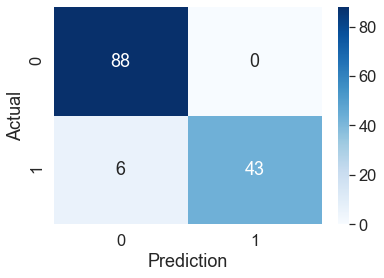

In [54]:
#TESTING
y_pred50Test=model.predict(x_test)

sns.set(font_scale=1.5) #  Ajuste tamaño de letra (var global)
conf_mat1=pd.crosstab(index=y_test, # filas = valor real
                     columns=y_pred50Test, # columnas = valor predicho
                     rownames=['Actual'], 
                     colnames=['Prediction']
                     )

import seaborn as sns
sns.heatmap(conf_mat1, annot=True, cmap='Blues', fmt='g')

# Grafiquemos la curva ROC<br>

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


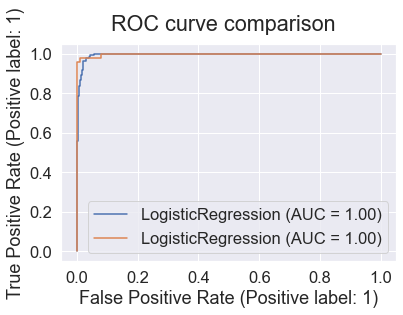

In [55]:
from sklearn.metrics import plot_roc_curve
import matplotlib.pyplot as plt

svc_disp = plot_roc_curve(model, x_train, y_train)
rfc_disp = plot_roc_curve(model, x_test, y_test, ax=svc_disp.ax_)
rfc_disp.figure_.suptitle("ROC curve comparison")
plt.show()

Tambien responde muy bien con datos que no conoce 97%.